###Install Library

In [ ]:
pip install opencv-python-headless reportlab

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 19.4 MB/s eta 0:00:00


###Import Library

In [ ]:
import cv2
import os
from reportlab.pdfgen import canvas
from reportlab.lib.pagesizes import letter
from reportlab.lib.utils import ImageReader
from google.colab.patches import cv2_imshow
from reportlab.lib.utils import ImageReader

###Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


###Video function to summarise

In [ ]:
def video_summarization(video_path, num_frames=10):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    summary_frames = []
    frame_indices = [int(i * frame_count / num_frames) for i in range(num_frames)]

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if cap.get(cv2.CAP_PROP_POS_FRAMES) in frame_indices:
            summary_frames.append(frame)

        if len(summary_frames) == num_frames:
            break

    cap.release()
    cv2.destroyAllWindows()

    return summary_frames

In [ ]:
# Example usage
video_path = '/content/drive/MyDrive/Interview_question_solved/video/video/animals/elefant_1280p.mp4'
summary_frames = video_summarization(video_path, num_frames=5)

###Summary frames

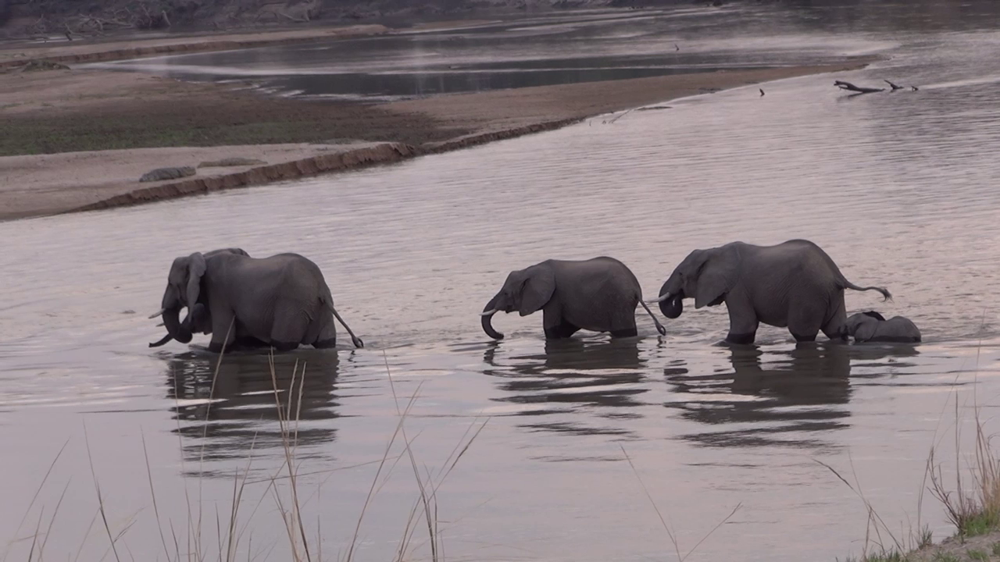

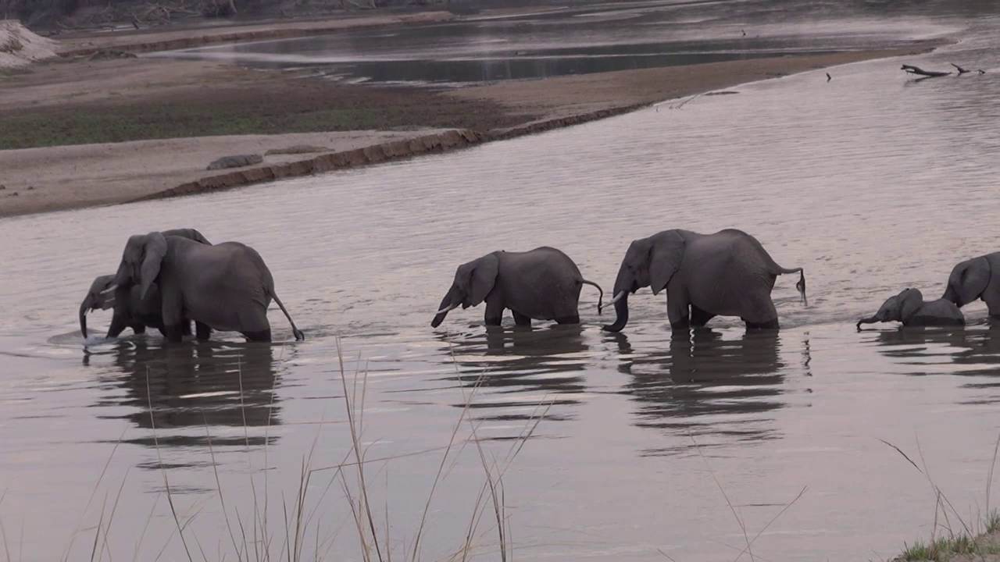

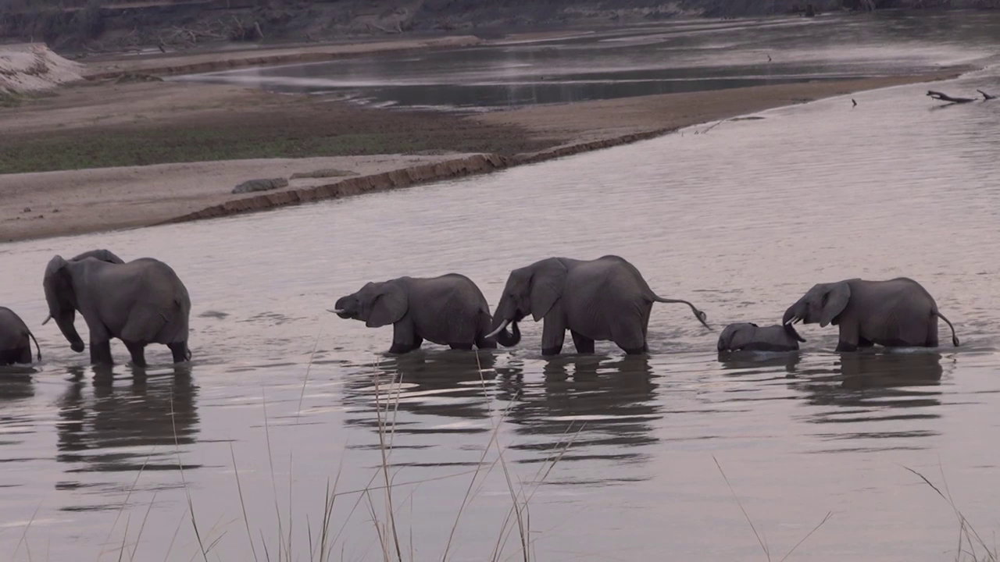

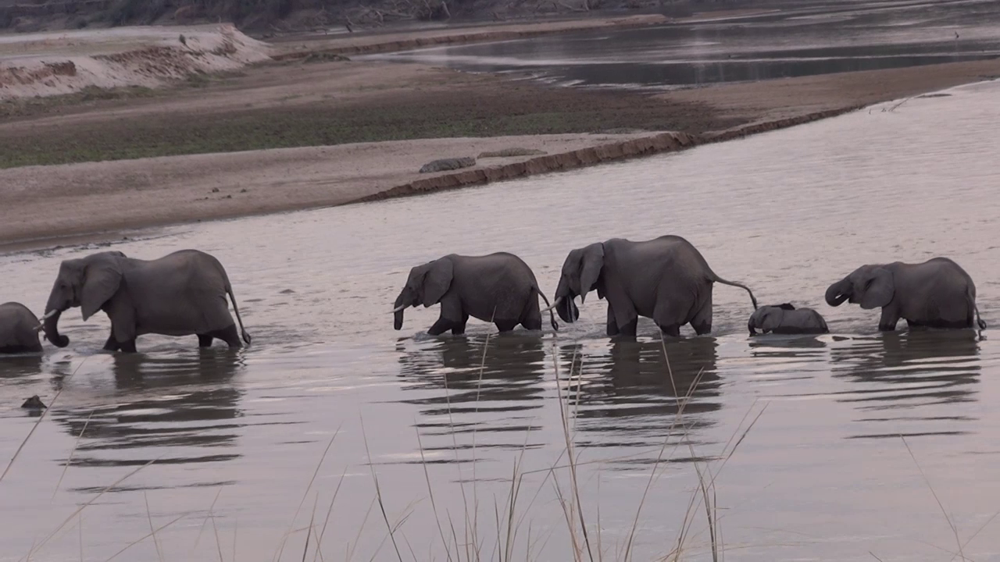

In [ ]:
# Display summary frames
for i, frame in enumerate(summary_frames):
    cv2_imshow(frame)

###Summary frames with names

In [ ]:
def video_summarization(video_path, num_frames=10):
    cap = cv2.VideoCapture(video_path)
    frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    frame_width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    frame_height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

    summary_frames = []
    frame_indices = [int(i * frame_count / num_frames) for i in range(num_frames)]

    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break

        if cap.get(cv2.CAP_PROP_POS_FRAMES) in frame_indices:
            # Annotate the frame with text
            text = f'Summary Frame {len(summary_frames) + 1}'
            cv2.putText(frame, text, (10, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2, cv2.LINE_AA)

            summary_frames.append(frame)

        if len(summary_frames) == num_frames:
            break

    cap.release()
    cv2.destroyAllWindows()

    return summary_frames

In [ ]:
# Example usage
video_path = '/content/drive/MyDrive/Interview_question_solved/video/video/animals/elefant_1280p.mp4'
summary_frames = video_summarization(video_path, num_frames=5)

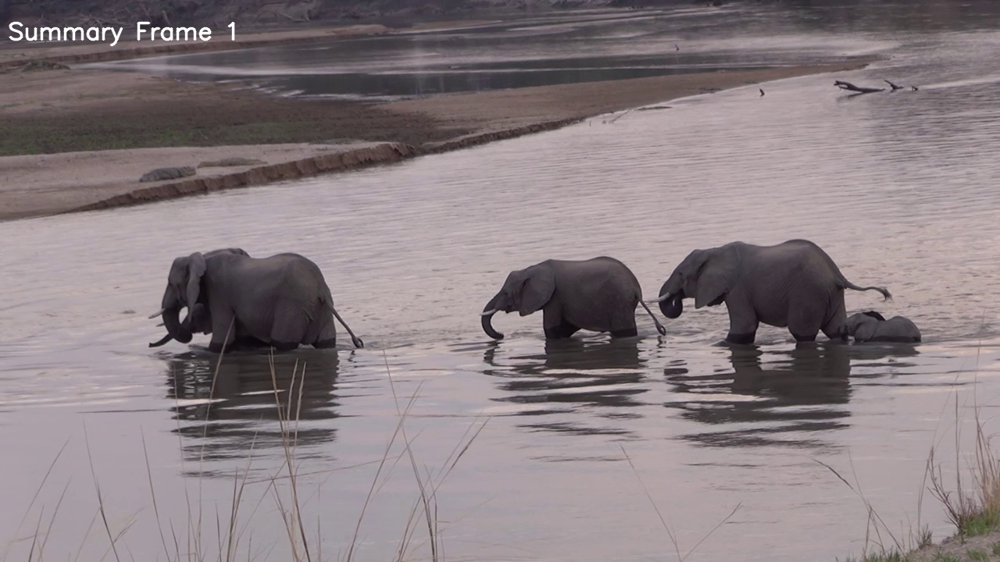

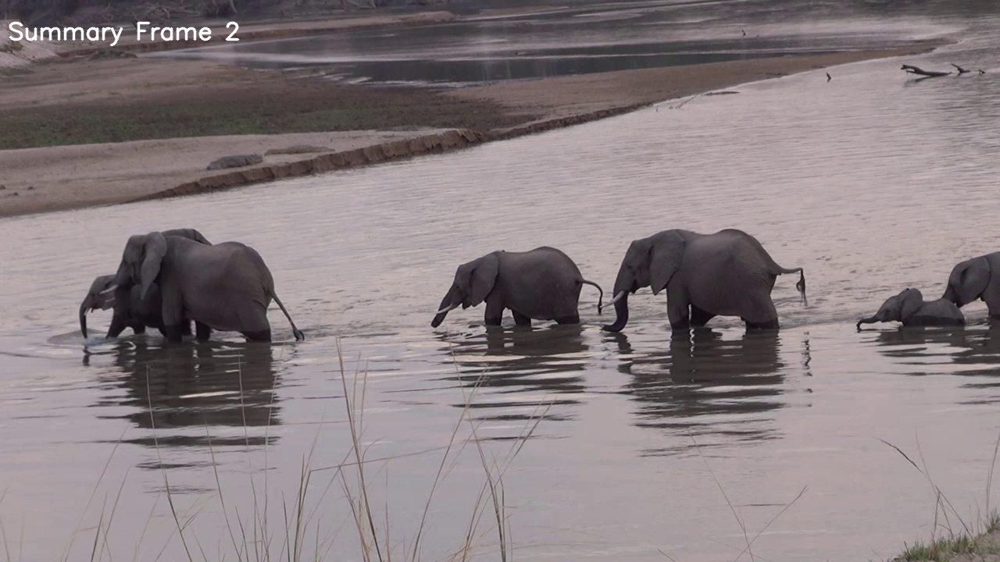

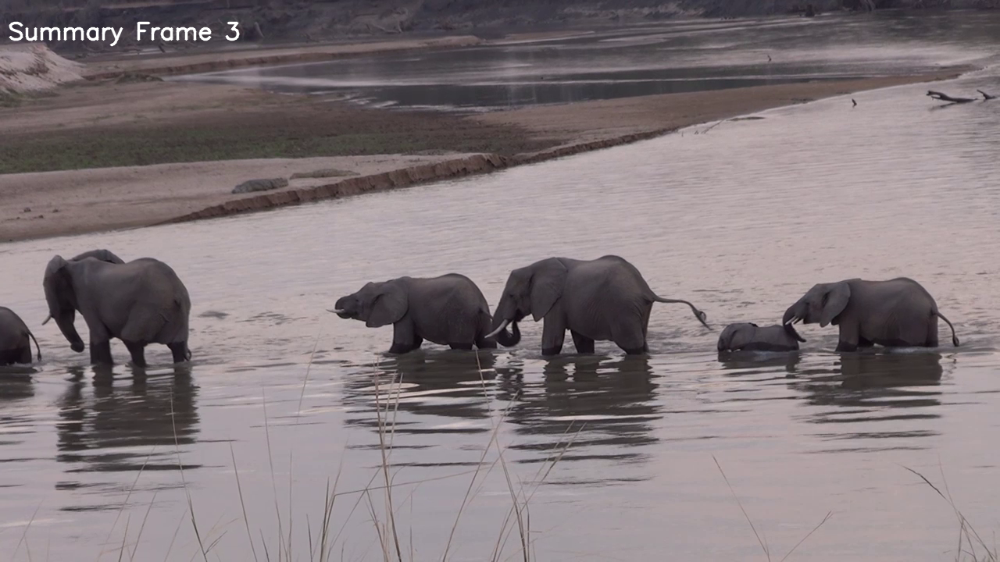

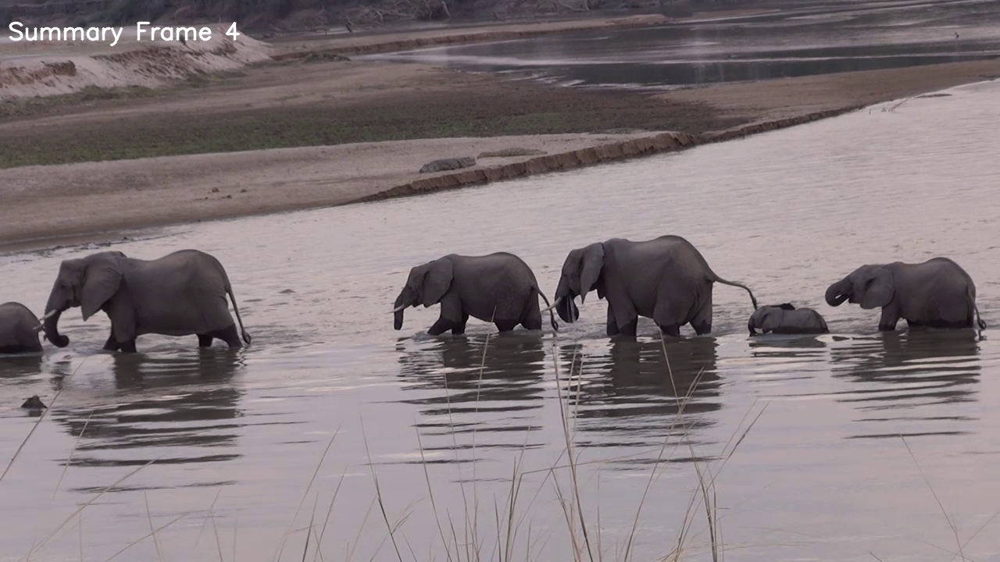

In [ ]:
# Display summary frames with text annotations
for i, frame in enumerate(summary_frames):
    cv2_imshow(frame)